In [7]:
import pandas as pd

In [2]:
fin_df

NameError: name 'fin_df' is not defined

In [8]:
fin_df= pd.read_csv("fin_df.csv")

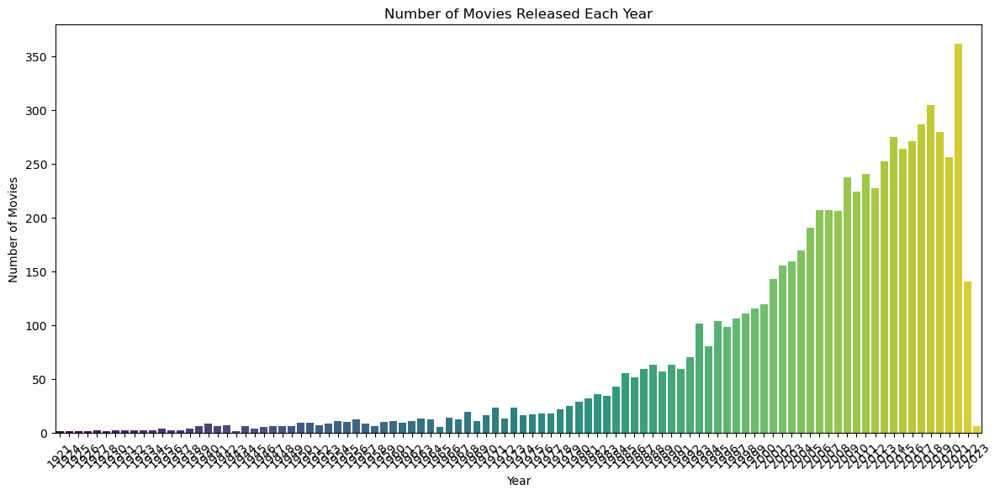

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group the DataFrame by 'Year' and count the number of movies in each year
year_counts = fin_df['Year'].value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=year_counts.index, y=year_counts.values, palette="viridis")
plt.xlabel("Year")
plt.ylabel("Number of Movies")
plt.title("Number of Movies Released Each Year")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

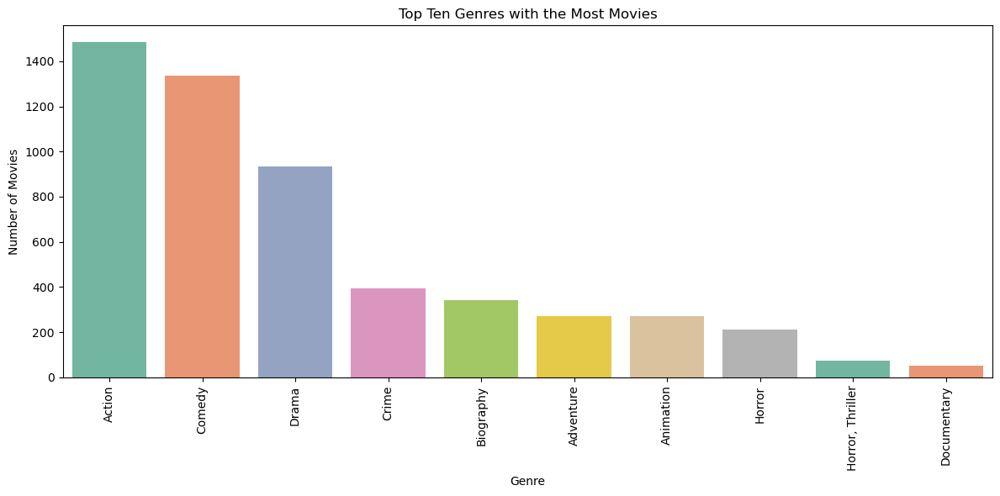

In [10]:
# Group the DataFrame by 'Genre' and count the number of movies in each genre
genre_counts = fin_df['Genre'].value_counts()

# Select the top ten genres
top_ten_genres = genre_counts.head(10)

# Create a count plot for the top ten genres
plt.figure(figsize=(12, 6))
sns.barplot(x=top_ten_genres.index, y=top_ten_genres.values, palette="Set2")
plt.xlabel("Genre")
plt.ylabel("Number of Movies")
plt.title("Top Ten Genres with the Most Movies")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [11]:
# Group the DataFrame by 'Genre' and calculate the total runtime and average rating for each genre
genre_stats = fin_df.groupby('Genre').agg({'Runtime': 'sum', 'Rating': 'mean'})

# Select the top ten genres with the most total runtime
top_ten_runtime_genres = genre_stats['Runtime'].nlargest(10)

# Select the top ten genres with the highest average rating
top_ten_rating_genres = genre_stats['Rating'].nlargest(10)

# Create subplots to display both top ten lists side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot top ten genres with the most total runtime
sns.barplot(x=top_ten_runtime_genres.values, y=top_ten_runtime_genres.index, ax=axes[0], palette="Set2")
axes[0].set_xlabel("Total Runtime (minutes)")
axes[0].set_ylabel("Genre")
axes[0].set_title("Top Ten Genres with the Most Total Runtime")

# Plot top ten genres with the highest average rating
sns.barplot(x=top_ten_rating_genres.values, y=top_ten_rating_genres.index, ax=axes[1], palette="Set2")
axes[1].set_xlabel("Average Rating")
axes[1].set_ylabel("Genre")
axes[1].set_title("Top Ten Genres with the Highest Average Rating")

plt.tight_layout()
plt.show()


TypeError: Cannot use method 'nlargest' with dtype object

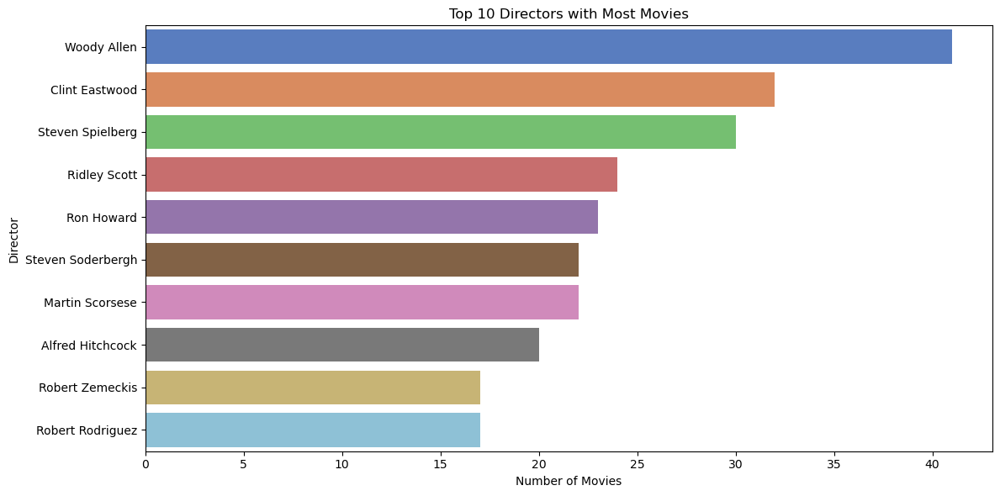

In [12]:
director_counts = fin_df['Director'].value_counts().head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x=director_counts.values, y=director_counts.index, palette="muted")
plt.xlabel("Number of Movies")
plt.ylabel("Director")
plt.title("Top 10 Directors with Most Movies")
plt.tight_layout()
plt.show()


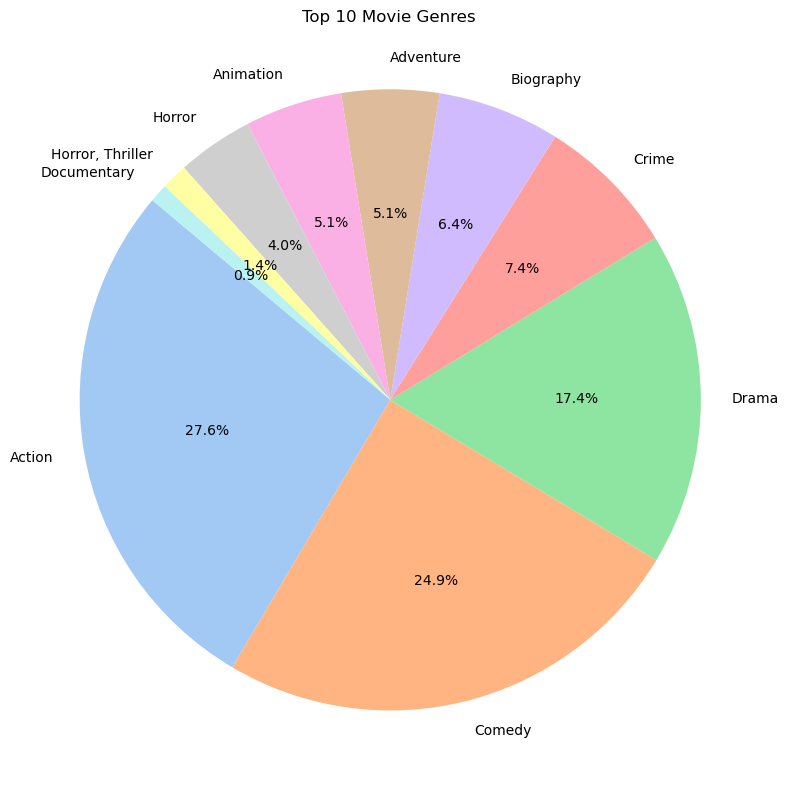

In [13]:
genre_counts = fin_df['Genre'].value_counts().head(10)

plt.figure(figsize=(8, 8))
plt.pie(genre_counts, labels=genre_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("pastel"))
plt.axis('equal')
plt.title("Top 10 Movie Genres")
plt.tight_layout()
plt.show()


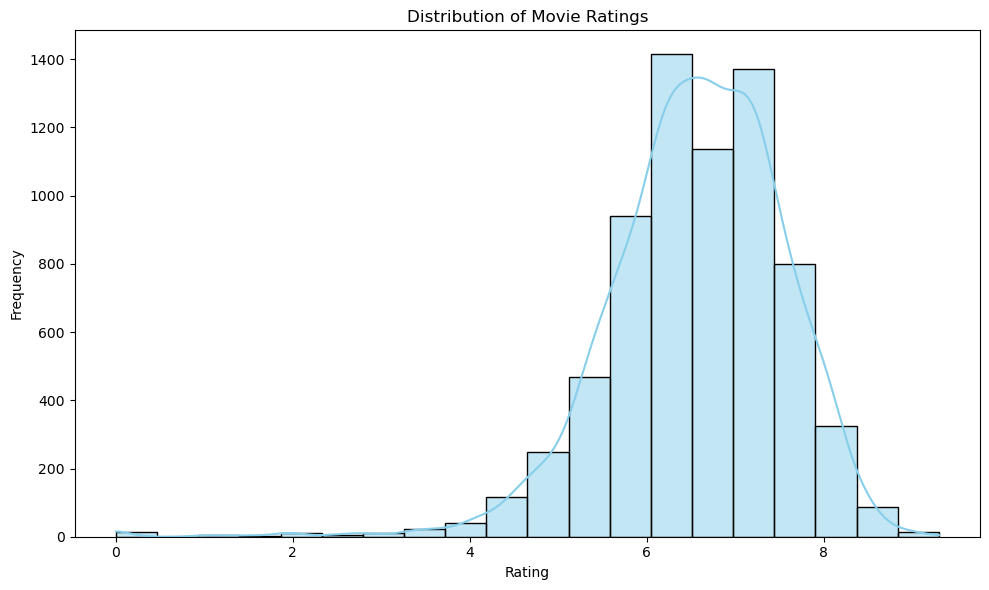

In [14]:
plt.figure(figsize=(10, 6))
sns.histplot(data=fin_df, x='Rating', bins=20, kde=True, color='skyblue')
plt.xlabel("Rating")
plt.ylabel("Frequency")
plt.title("Distribution of Movie Ratings")
plt.tight_layout()
plt.show()


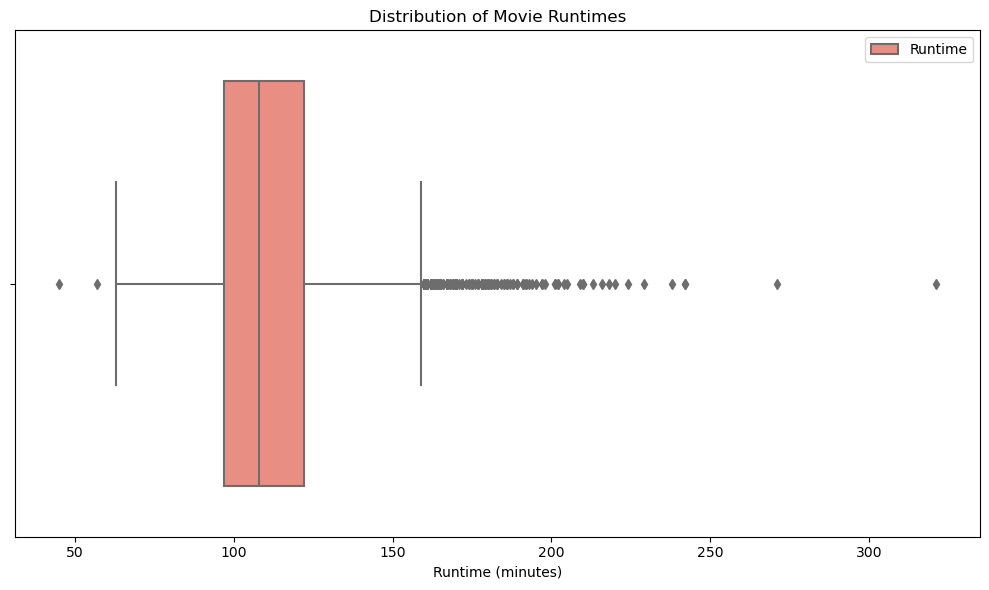

In [15]:

import seaborn as sns

# Ensure 'Runtime' is of numeric data type
fin_df['Runtime'] = pd.to_numeric(fin_df['Runtime'], errors='coerce')

# Create a horizontal box plot
plt.figure(figsize=(10, 6))
sns.boxplot(data=fin_df, x='Runtime', color='salmon', orient='h')
plt.xlabel("Runtime (minutes)")
plt.title("Distribution of Movie Runtimes")
plt.tight_layout()

# Add a legend
plt.legend(labels=['Runtime'])

plt.show()



In [16]:
import seaborn as sns

# Extract the month from 'Release_Date'
fin_df['Release_Month'] = fin_df['Release_Date'].dt.month

# Create a list of month names
month_order = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

# Create the countplot
plt.figure(figsize=(10, 6))
sns.countplot(data=fin_df, x='Release_Month', palette="Set3", order=range(1, 13))
plt.xlabel("Month")
plt.ylabel("Number of Movies")
plt.title("Number of Movies Released by Month")
plt.xticks(ticks=range(12), labels=month_order)
plt.tight_layout()
plt.show()



AttributeError: Can only use .dt accessor with datetimelike values

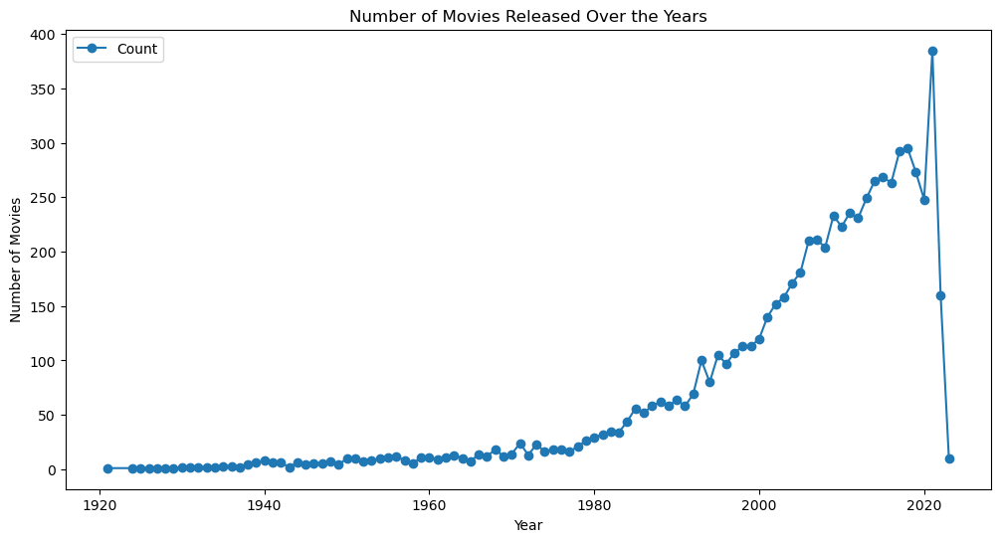

In [17]:
# Convert 'Release_Date' to datetime
fin_df['Release_Date'] = pd.to_datetime(fin_df['Release_Date'])

# Extract the year from the release date
fin_df['Release_Year'] = fin_df['Release_Date'].dt.year

# Number of movies released each year
yearly_movie_counts = fin_df['Release_Year'].value_counts().sort_index()

# Plot a line chart
plt.figure(figsize=(12, 6))
yearly_movie_counts.plot(kind='line', marker='o')
plt.title('Number of Movies Released Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Movies')
plt.legend(['Count'])
plt.show()

C:\Users\asuri\AppData\Local\Temp\ipykernel_12552\3950161762.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrows=1, ncols=num_cols, figsize=(16, 6), sharey=False)


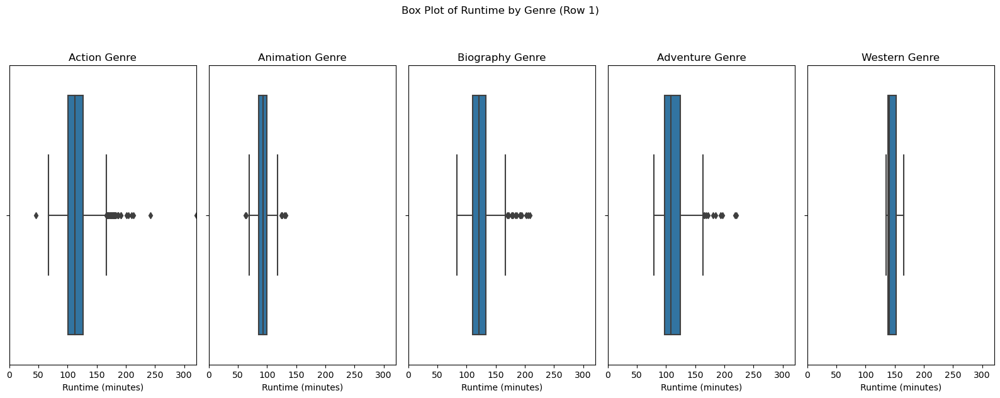

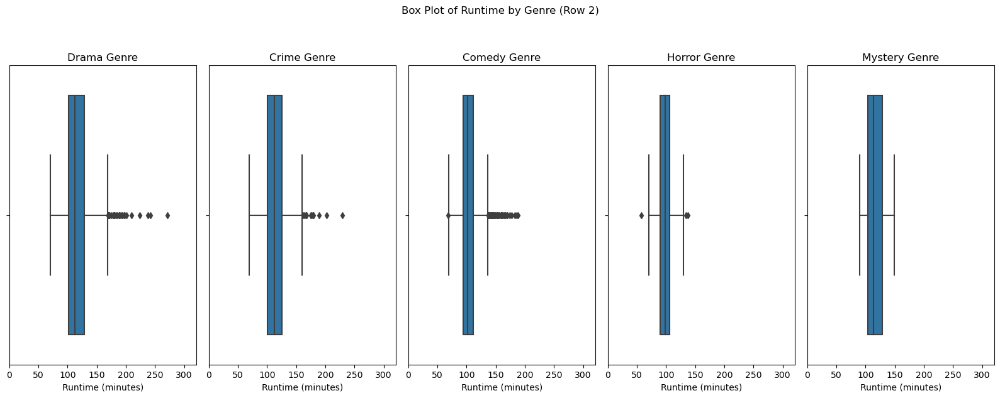

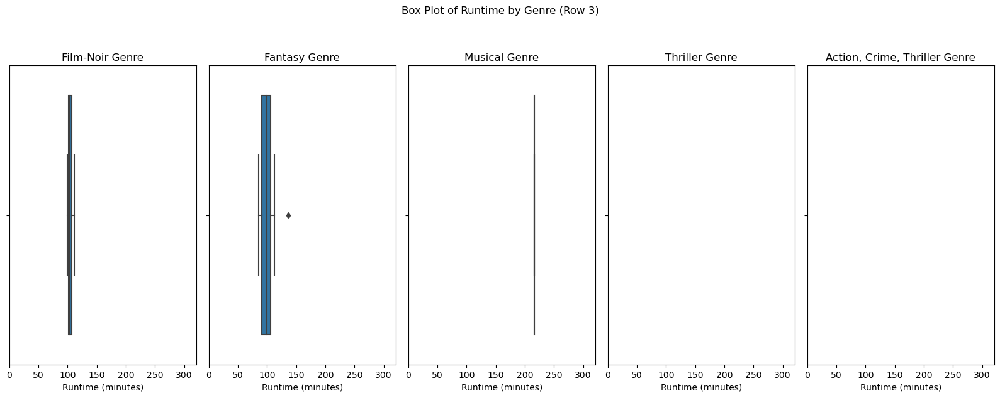

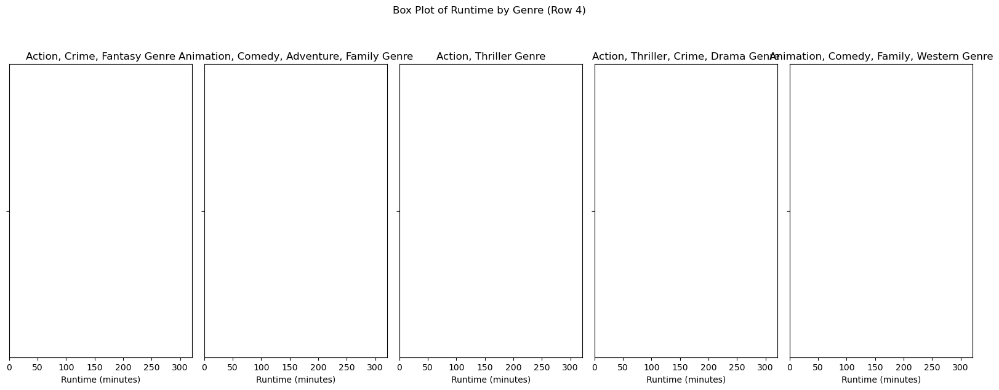

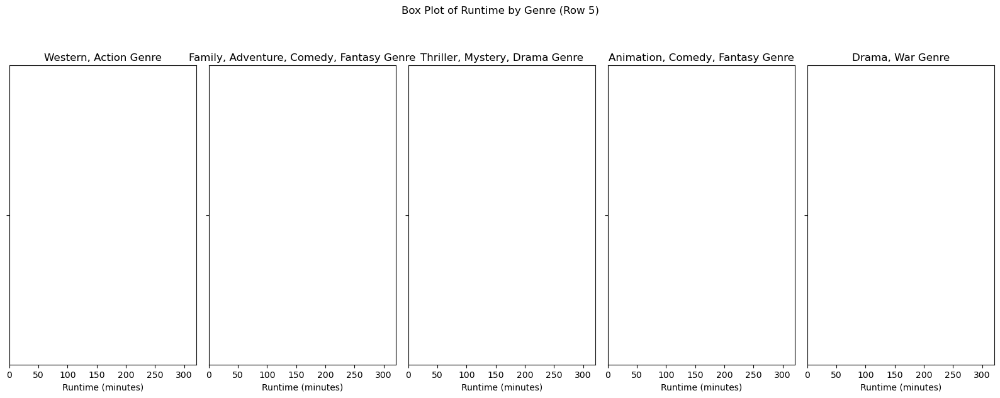

...

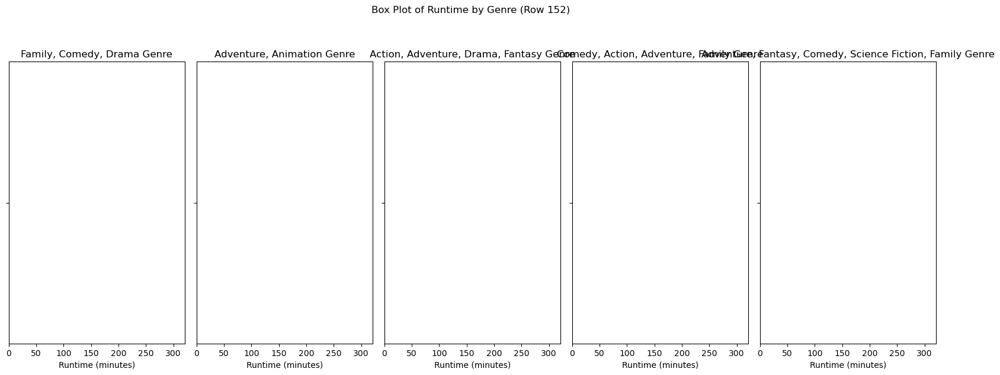

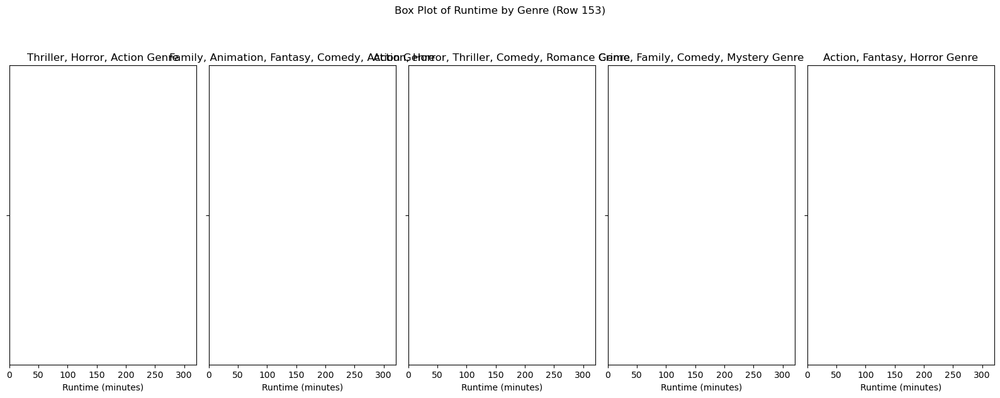

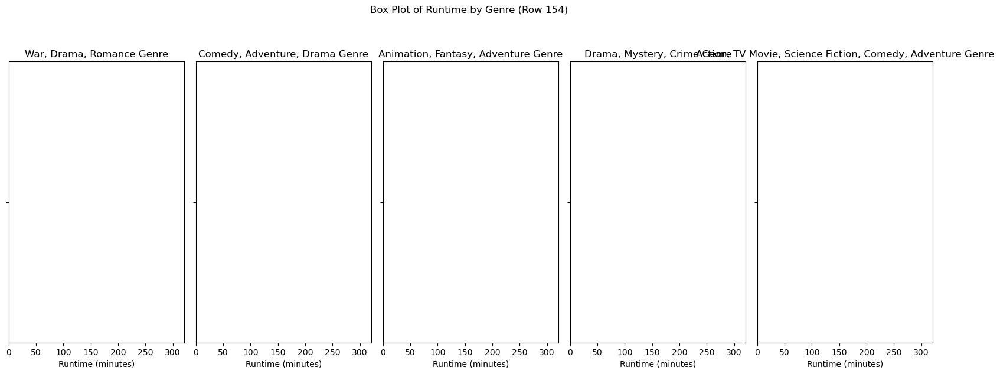

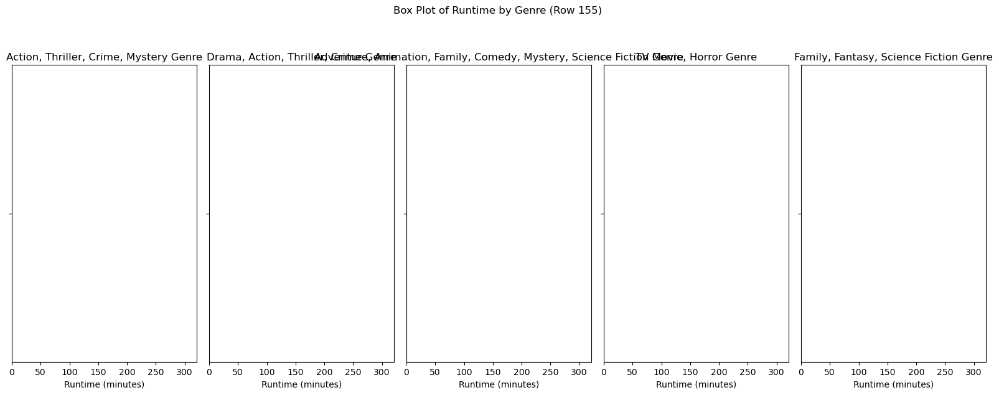

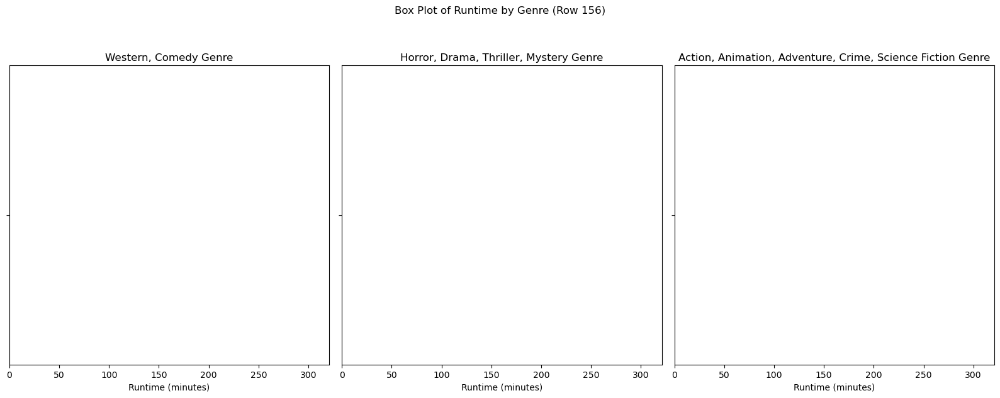

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Ensure 'Runtime' is of numeric data type
fin_df['Runtime'] = pd.to_numeric(fin_df['Runtime'], errors='coerce')

# Define the unique genres in your dataset
unique_genres = fin_df['Genre'].unique()

# Number of genres to display in each row
genres_per_row = 5
num_rows = len(unique_genres) // genres_per_row + (len(unique_genres) % genres_per_row > 0)

# Create subplots for each set of genres
for row in range(num_rows):
    start_idx = row * genres_per_row
    end_idx = (row + 1) * genres_per_row
    selected_genres = unique_genres[start_idx:end_idx]
    num_cols = len(selected_genres)

    fig, axes = plt.subplots(nrows=1, ncols=num_cols, figsize=(16, 6), sharey=False)

    for i, genre in enumerate(selected_genres):
        genre_data = fin_df[fin_df['Genre'] == genre]
        sns.boxplot(x='Runtime', data=genre_data, ax=axes[i])
        axes[i].set_title(f'{genre} Genre')
        axes[i].set_xlabel('Runtime (minutes)')
        axes[i].set_ylabel('')
        axes[i].set_xlim(0, np.ceil(fin_df['Runtime'].max()))

    plt.suptitle(f'Box Plot of Runtime by Genre (Row {row + 1})', y=1.05)
    plt.tight_layout()

plt.show()


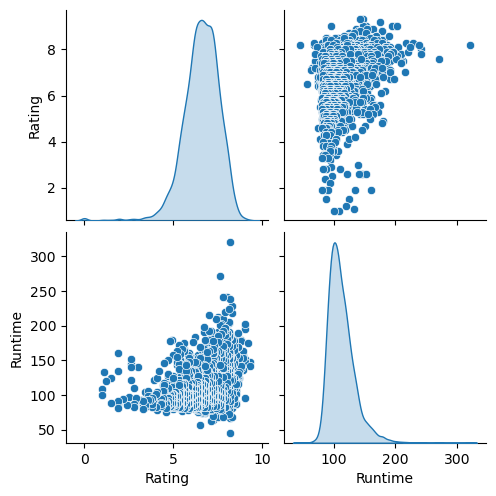

In [19]:
import seaborn as sns

# Select numerical columns for pair plot
numerical_cols = ['Rating', 'Runtime']

# Create a pair plot
sns.pairplot(fin_df[numerical_cols], diag_kind='kde')
plt.show()


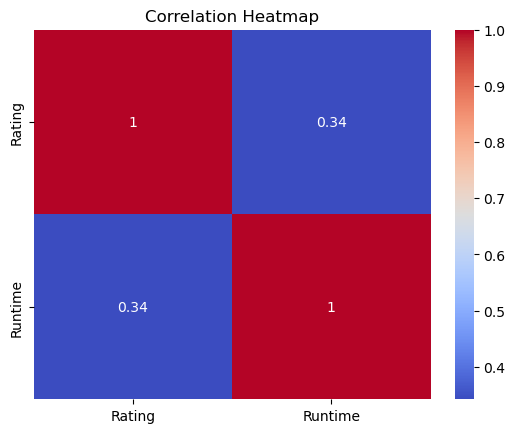

In [20]:
# Calculate the correlation matrix
correlation_matrix = fin_df[numerical_cols].corr()

# Create a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


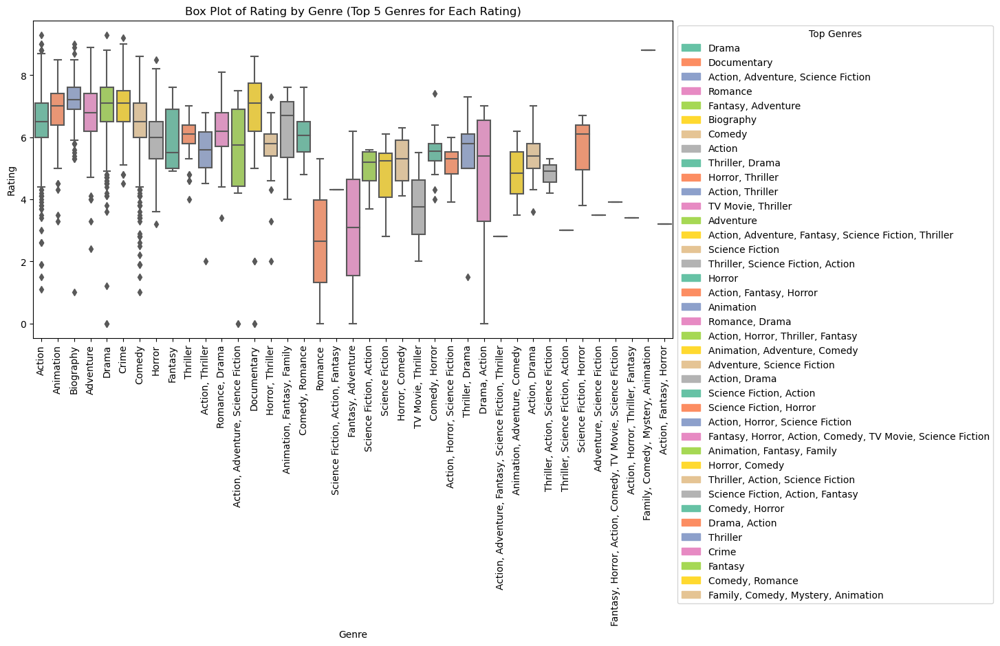

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group by 'Rating' and calculate the top 5 genres for each rating
top_genres_by_rating = fin_df.groupby('Rating')['Genre'].apply(lambda x: x.value_counts().head(5).index.tolist())

# Filter the dataset to include only the top 5 genres for each rating
filtered_df = fin_df[fin_df['Genre'].isin(top_genres_by_rating.explode())]

# Create a color palette for the genres
palette = sns.color_palette("Set2", n_colors=len(top_genres_by_rating.explode().unique()))

# Create the box plot
plt.figure(figsize=(12, 6))
plt.xticks(rotation=90)
sns.boxplot(x='Genre', y='Rating', data=filtered_df, palette=palette)
plt.title('Box Plot of Rating by Genre (Top 5 Genres for Each Rating)')
plt.xlabel('Genre')
plt.ylabel('Rating')

# Create a legend and place it outside the graph
legend_labels = top_genres_by_rating.explode().unique()
handles = [plt.Rectangle((0, 0), 1, 1, color=palette[i], label=genre) for i, genre in enumerate(legend_labels)]
plt.legend(handles=handles, title='Top Genres', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


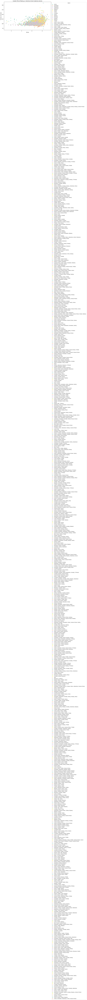

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
scatterplot = sns.scatterplot(data=fin_df, x='Rating', y='Runtime', hue='Genre', palette='Set2')
plt.title('Scatter Plot of Rating vs. Runtime (Color-Coded by Genre)')
plt.xlabel('Rating')
plt.ylabel('Runtime (minutes)')

# Move the legend outside the plot
plt.legend(title='Genre', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()



In [23]:
import spacy
import pandas as pd

# Load the spaCy English language model
nlp = spacy.load("en_core_web_sm")

# Function to extract nouns, adverbs, adjectives, and verbs from a sentence
def extract_words(text):
    doc = nlp(text)
    words = [token.text for token in doc if token.pos_ in {"NOUN", "ADV", "ADJ", "VERB"}]
    return " ".join(words)

# Apply the function to the 'Plot_Summary' column and create a new 'words' column
fin_df['words'] = fin_df['Plot_Summary'].apply(extract_words)

# Display the DataFrame with the new 'words' column
fin_df[['Plot_Summary', 'words']]


,Plot_Summary,words
0,"When greed paves the way for betrayal, schemin...",greed paves way betrayal scheming murder young...
1,When the menace known as the Joker wreaks havo...,menace known wreaks havoc chaos people accept ...
2,Gandalf and Aragorn lead the World of Men agai...,Gandalf lead army draw gaze approach
3,A thief who steals corporate secrets through t...,thief steals corporate secrets use dream shari...
4,While Frodo and Sam edge closer to Mordor with...,edge closer help shifty divided fellowship mak...
...,...,...
7026,The USS Essex is travelling in the furthest re...,travelling furthest reaches known encounters g...
7027,Two affluent suburban girls clash with the Lat...,affluent suburban girls clash gang culture
7028,Batman and Robin of the 1960s live action seri...,1960s live action series back action take fien...
7029,The ultimate Gravity Falls behind the scenes d...,ultimate Gravity Falls scenes documentary


In [24]:
fin_df

,Title,Year,Director,Actors,Rating,Runtime,Genre,Release_Date,Plot_Summary,Release_Year,words
0,Kantara,2022,Rishab Shetty,"Rishab Shetty, Sapthami Gowda, Kishore Kumar G...",9.3,148.0,Action,2022-09-30,"When greed paves the way for betrayal, schemin...",2022,greed paves way betrayal scheming murder young...
1,The Dark Knight,2008,Christopher Nolan,"Christian Bale, Heath Ledger, Aaron Eckhart, M...",9.0,152.0,Action,2008-07-18,When the menace known as the Joker wreaks havo...,2008,menace known wreaks havoc chaos people accept ...
2,The Lord of the Rings: The Return of the King,2003,Peter Jackson,"Elijah Wood, Viggo Mortensen, Ian McKellen, Or...",9.0,201.0,Action,2003-12-17,Gandalf and Aragorn lead the World of Men agai...,2003,Gandalf lead army draw gaze approach
3,Inception,2010,Christopher Nolan,"Leonardo DiCaprio, Joseph Gordon-Levitt, Ellio...",8.8,148.0,Action,2010-07-16,A thief who steals corporate secrets through t...,2010,thief steals corporate secrets use dream shari...
4,The Lord of the Rings: The Two Towers,2002,Peter Jackson,"Elijah Wood, Ian McKellen, Viggo Mortensen, Or...",8.8,179.0,Action,2002-12-18,While Frodo and Sam edge closer to Mordor with...,2002,edge closer help shifty divided fellowship mak...
...,...,...,...,...,...,...,...,...,...,...,...
7026,Beyond White Space,2018,Ken Locsmandi,"Holt McCallany, Zulay Henao, Dave Sheridan",4.7,NaN,"Science Fiction, Thriller",2018-12-14,The USS Essex is travelling in the furthest re...,2018,travelling furthest reaches known encounters g...
7027,Havoc,2005,Barbara Kopple,"Anne Hathaway, Bijou Phillips, Shiri Appleby",5.2,NaN,"Crime, Drama",2005-10-16,Two affluent suburban girls clash with the Lat...,2005,affluent suburban girls clash gang culture
7028,Batman: Return of the Caped Crusaders,2016,Rick Morales,"Adam West, Burt Ward, Julie Newmar",6.5,NaN,"Action, Animation, Adventure, Crime, Science F...",2016-10-11,Batman and Robin of the 1960s live action seri...,2016,1960s live action series back action take fien...
7029,One Crazy Summer: A Look Back at Gravity Falls,2018,Brian Ward,"Matt Braly, Brad Breeck, Jackie Buscarino, Rob...",2.0,NaN,Documentary,2018-07-24,The ultimate Gravity Falls behind the scenes d...,2018,ultimate Gravity Falls scenes documentary


In [25]:
news_df= pd.read_csv("output.csv")
news_df = news_df.drop(columns=['link'])
news_df

,headline,category,short_description,authors,date
0,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,Health experts said it is too early to predict...,"Carla K. Johnson, AP",9/23/2022
1,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,He was subdued by passengers and crew when he ...,Mary Papenfuss,9/23/2022
2,23 Of The Funniest Tweets About Cats And Dogs ...,COMEDY,"""Until you have a dog you don't understand wha...",Elyse Wanshel,9/23/2022
3,The Funniest Tweets From Parents This Week (Se...,PARENTING,"""Accidentally put grown-up toothpaste on my to...",Caroline Bologna,9/23/2022
4,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,Amy Cooper accused investment firm Franklin Te...,Nina Golgowski,9/22/2022
...,...,...,...,...,...
209522,RIM CEO Thorsten Heins' 'Significant' Plans Fo...,"Reuters, Reuters",https://www.huffingtonpost.com/entry/rim-ceo-t...,Verizon Wireless and AT&T are already promotin...,1/28/2012
209523,Maria Sharapova Stunned By Victoria Azarenka I...,NaN,https://www.huffingtonpost.com/entry/maria-sha...,"Afterward, Azarenka, more effusive with the pr...",1/28/2012
209524,"Giants Over Patriots, Jets Over Colts Among M...",NaN,https://www.huffingtonpost.com/entry/super-bow...,"Leading up to Super Bowl XLVI, the most talked...",1/28/2012
209525,Aldon Smith Arrested: 49ers Linebacker Busted ...,NaN,https://www.huffingtonpost.com/entry/aldon-smi...,CORRECTION: An earlier version of this story i...,1/28/2012


In [26]:
# Function to count rows with URLs in the 'short_description' column
def count_urls(text):
    # Regular expression pattern to match URLs
    url_pattern = r'http[s]?://\S+'
    # Search for URLs in the text
    urls = re.findall(url_pattern, text) if pd.notna(text) else []
    # Return 1 if at least one URL is found, 0 otherwise
    return 1 if len(urls) > 0 else 0

# Apply the 'count_urls' function to count URLs in each row
news_df['url_count'] = news_df['short_description'].apply(count_urls)

# Replace rows with links in 'short_description' with values from 'author'
news_df.loc[news_df['url_count'] == 1, 'short_description'] = news_df['authors']

# Drop the 'url_count' column if you no longer need it
news_df = news_df.drop(columns=['url_count'])

news_df

NameError: name 're' is not defined

In [27]:
import pandas as pd

# Assuming you have already loaded your DataFrame news_df

# Count rows with NaN in the "date" column
nan_count = news_df['date'].isnull().sum()

print("Number of rows with NaN values in the 'date' column:", nan_count)


Number of rows with NaN values in the 'date' column: 0


In [28]:
# import matplotlib.pyplot as plt

# # Assuming 'news_df' is your DataFrame
# category_counts = news_df['category'].value_counts()
# category_counts.plot(kind='bar', figsize=(10, 6))
# plt.title('News Categories')
# plt.xlabel('Category')
# plt.ylabel('Count')
# plt.xticks(rotation=90)
# plt.show()


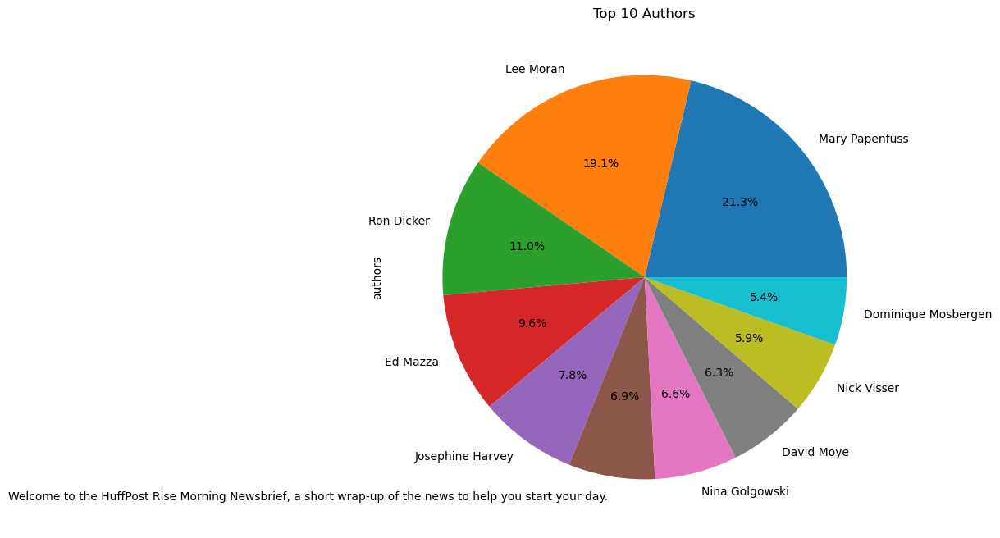

In [29]:
author_counts = news_df['authors'].value_counts().head(10)  # Top 10 authors
author_counts.plot(kind='pie', autopct='%1.1f%%', figsize=(8, 8))
plt.title('Top 10 Authors')
plt.show()


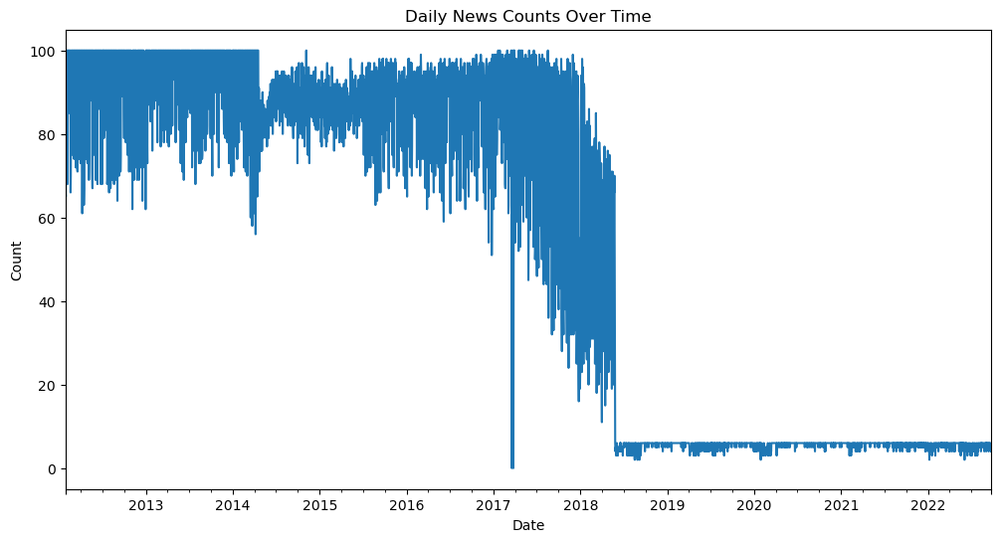

In [30]:
news_df['date'] = pd.to_datetime(news_df['date'])  # Convert 'date' column to datetime
news_df.set_index('date', inplace=True)
daily_news_counts = news_df.resample('D').size()
daily_news_counts.plot(kind='line', figsize=(12, 6))
plt.title('Daily News Counts Over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.show()


In [31]:
import pandas as pd

# Summary statistics for numeric columns
summary_stats = fin_df[['Rating', 'Runtime']].describe()

print(summary_stats)


            Rating      Runtime
count  7031.000000  5024.000000
mean      6.557787   112.034435
std       1.004194    21.247192
min       0.000000    45.000000
25%       6.000000    97.000000
50%       6.600000   108.000000
75%       7.200000   122.000000
max       9.300000   321.000000


In [32]:

# import pandas as pd
# import re

# # Sample DataFrame (replace with your actual DataFrame)

# # Function to count rows with URLs in the 'short_description' column
# def count_urls(text):
#     # Regular expression pattern to match URLs
#     url_pattern = r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+'
#     # Search for URLs in the text
#     urls = re.findall(url_pattern, text)
#     # Return the count of URLs found
#     return len(urls)

# # Apply the 'count_urls' function to count URLs in each row
# news_df['url_count'] = news_df['short_description'].apply(count_urls)

# # Display the DataFrame with the 'url_count' column
# news_df


In [33]:
import pandas as pd
import re

# Function to check if a row contains a URL in the 'short_description' column
def contains_url(text):
    # Regular expression pattern to match URLs
    url_pattern = r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+'
    # Search for URLs in the text
    urls = re.findall(url_pattern, text)
    # Check if any URLs were found
    return len(urls) > 0

# Apply the 'contains_url' function to check for URLs in each row
url_count = news_df['short_description'].apply(contains_url).sum()

# Print the count of rows with URLs in the 'short_description' column
print(f"Number of rows with URLs: {url_count}")


Number of rows with URLs: 200853


In [34]:
# Assuming you have a DataFrame called 'news_df', replace it with your actual DataFrame name
# Count the number of rows with NaN values in the 'headline' column
nan_count = news_df['headline'].isna().sum()

# Display the count
print("Number of rows with NaN values in the 'headline' column:", nan_count)
# Assuming you have a DataFrame called 'news_df', replace it with your actual DataFrame name
# Remove rows with NaN values in the 'headline' column
news_df.dropna(subset=['headline'], inplace=True)



Number of rows with NaN values in the 'headline' column: 6


In [35]:
import spacy
import pandas as pd

# Load the spaCy English language model
nlp = spacy.load("en_core_web_sm")

# Function to extract nouns, adverbs, adjectives, and verbs from a sentence
def extract_words(text):
    doc = nlp(text)
    words = [token.text for token in doc if token.pos_ in {"NOUN", "ADV", "ADJ", "VERB"}]
    return " ".join(words)

# Assuming you have a DataFrame called 'news_df', replace it with your actual DataFrame name
# Create a new column 'words_news' by applying the 'extract_words' function
news_df['words_news'] = news_df['headline'].apply(extract_words)

# Display the DataFrame with the new 'words_news' column
print(news_df[['headline', 'words_news']])



KeyboardInterrupt: 

In [ ]:
import spacy
import pandas as pd

# Load the spaCy English language model
nlp = spacy.load("en_core_web_sm")

# Function to extract nouns, adverbs, adjectives, and verbs from a sentence
def extract_words(text):
    doc = nlp(text)
    words = [token.text for token in doc if token.pos_ in {"NOUN", "ADV", "ADJ", "VERB"}]
    return " ".join(words)

# Assuming you have a DataFrame called 'news_df', replace it with your actual DataFrame name
# Create a new column 'words_news' by applying the 'extract_words' function in batches
batch_size = 10000  # Adjust the batch size as needed
batches = [news_df[i:i+batch_size] for i in range(0, len(news_df), batch_size)]
for batch in batches:
    batch.loc[:, 'words_news'] = batch['short_description'].apply(extract_words)

# Concatenate the batches back into the original DataFrame
news_df = pd.concat(batches)

# Display the DataFrame with the new 'words_news' column
print(news_df[['short_description', 'words_news']])


In [40]:
fin_df

,Title,Year,Director,Actors,Rating,Runtime,Genre,Release_Date,Plot_Summary,Release_Year,words
0,Kantara,2022,Rishab Shetty,"Rishab Shetty, Sapthami Gowda, Kishore Kumar G...",9.3,148.0,Action,2022-09-30,"When greed paves the way for betrayal, schemin...",2022,greed paves way betrayal scheming murder young...
1,The Dark Knight,2008,Christopher Nolan,"Christian Bale, Heath Ledger, Aaron Eckhart, M...",9.0,152.0,Action,2008-07-18,When the menace known as the Joker wreaks havo...,2008,menace known wreaks havoc chaos people accept ...
2,The Lord of the Rings: The Return of the King,2003,Peter Jackson,"Elijah Wood, Viggo Mortensen, Ian McKellen, Or...",9.0,201.0,Action,2003-12-17,Gandalf and Aragorn lead the World of Men agai...,2003,Gandalf lead army draw gaze approach
3,Inception,2010,Christopher Nolan,"Leonardo DiCaprio, Joseph Gordon-Levitt, Ellio...",8.8,148.0,Action,2010-07-16,A thief who steals corporate secrets through t...,2010,thief steals corporate secrets use dream shari...
4,The Lord of the Rings: The Two Towers,2002,Peter Jackson,"Elijah Wood, Ian McKellen, Viggo Mortensen, Or...",8.8,179.0,Action,2002-12-18,While Frodo and Sam edge closer to Mordor with...,2002,edge closer help shifty divided fellowship mak...
...,...,...,...,...,...,...,...,...,...,...,...
7026,Beyond White Space,2018,Ken Locsmandi,"Holt McCallany, Zulay Henao, Dave Sheridan",4.7,NaN,"Science Fiction, Thriller",2018-12-14,The USS Essex is travelling in the furthest re...,2018,travelling furthest reaches known encounters g...
7027,Havoc,2005,Barbara Kopple,"Anne Hathaway, Bijou Phillips, Shiri Appleby",5.2,NaN,"Crime, Drama",2005-10-16,Two affluent suburban girls clash with the Lat...,2005,affluent suburban girls clash gang culture
7028,Batman: Return of the Caped Crusaders,2016,Rick Morales,"Adam West, Burt Ward, Julie Newmar",6.5,NaN,"Action, Animation, Adventure, Crime, Science F...",2016-10-11,Batman and Robin of the 1960s live action seri...,2016,1960s live action series back action take fien...
7029,One Crazy Summer: A Look Back at Gravity Falls,2018,Brian Ward,"Matt Braly, Brad Breeck, Jackie Buscarino, Rob...",2.0,NaN,Documentary,2018-07-24,The ultimate Gravity Falls behind the scenes d...,2018,ultimate Gravity Falls scenes documentary


In [41]:
news_df

,headline,category,short_description,authors
date,,,,
2022-09-23,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,Health experts said it is too early to predict...,"Carla K. Johnson, AP"
2022-09-23,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,He was subdued by passengers and crew when he ...,Mary Papenfuss
2022-09-23,23 Of The Funniest Tweets About Cats And Dogs ...,COMEDY,"""Until you have a dog you don't understand wha...",Elyse Wanshel
2022-09-23,The Funniest Tweets From Parents This Week (Se...,PARENTING,"""Accidentally put grown-up toothpaste on my to...",Caroline Bologna
2022-09-22,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,Amy Cooper accused investment firm Franklin Te...,Nina Golgowski
...,...,...,...,...
2012-01-28,RIM CEO Thorsten Heins' 'Significant' Plans Fo...,"Reuters, Reuters",https://www.huffingtonpost.com/entry/rim-ceo-t...,Verizon Wireless and AT&T are already promotin...
2012-01-28,Maria Sharapova Stunned By Victoria Azarenka I...,NaN,https://www.huffingtonpost.com/entry/maria-sha...,"Afterward, Azarenka, more effusive with the pr..."
2012-01-28,"Giants Over Patriots, Jets Over Colts Among M...",NaN,https://www.huffingtonpost.com/entry/super-bow...,"Leading up to Super Bowl XLVI, the most talked..."


In [42]:
import pandas as pd

# Assuming 'Release_Date' is the date column in 'movies_df'
# Assuming 'date' is the date column in 'news_df'

# Convert both date columns to datetime, if they are not already
fin_df['Release_Date'] = pd.to_datetime(fin_df['Release_Date'])
news_df['date'] = pd.to_datetime(news_df['date'])

# Perform an inner join based on the 'date' column
movies_news = pd.merge(fin_df, news_df, left_on='Release_Date', right_on='date', how='inner')

# The resulting DataFrame 'merged_df' will contain rows where the date matches in both DataFrames


KeyError: 'date'

In [37]:
# Rename the 'words' column to 'words_movies'
movies_news.rename(columns={'words': 'words_movies'}, inplace=True)

# Count the number of columns with at least 3 NaN values
columns_with_nan_count = (merged_df.isna().sum() >= 1).sum()

# Print the count of such columns
print(f"Number of columns with at least 3 NaN values: {columns_with_nan_count}")


NameError: name 'movies_news' is not defined

In [38]:
movies_news

NameError: name 'movies_news' is not defined

In [54]:
movies_news=pd.read_csv("movies_news.csv")

In [52]:
# Assuming you have a DataFrame called 'movies_news', replace it with your actual DataFrame name
# Specify the file path where you want to save the CSV file
file_path = "movies_news.csv"

# Save the DataFrame to a CSV file
movies_news.to_csv(file_path, index=False)

# Display a message indicating the file has been saved
print(f"DataFrame saved as {file_path}")


NameError: name 'movies_news' is not defined

In [55]:
# Sample the dataset to 20,000 rows
sampled_df = movies_news.sample(n=20000, random_state=42)


In [56]:
sampled_df

,Title,Year,Director,Actors,Rating,Runtime,Genre,Release_Date,Plot_Summary,words_movies,headline,category,short_description,authors,date
87281,The SpongeBob Movie: Sponge Out of Water,2015,"Directors:Paul Tibbitt, Mike Mitchell","Tom Kenny, Antonio Banderas, Bill Fagerbakke, ...",6.0,92,Animation,2015-02-06,When a diabolical pirate above the sea steals ...,diabolical pirate sea steals secret formula ne...,Fighting the New Stupidity,"Keith M. Parsons, ContributorPhilosopher, hist...",Vaccines are a great triumph of the human inte...,Vaccines are a great triumph of the human inte...,2015-02-06
129015,Entourage,2015,Doug Ellin,"Adrian Grenier, Kevin Connolly, Jerry Ferrara,...",6.5,104,Comedy,2015-07-18,Film star Vince Chase navigates the vapid terr...,navigates vapid terrain close circle friends t...,Harper Lee's 'Watchmen' Infused With Religious...,"Cathy Lynn Grossman, Religion News Service",(RNS) Harper Lee’s “new” book “Go Set a Watchm...,(RNS) Harper Lee’s “new” book “Go Set a Watchm...,2015-07-18
85081,Baywatch,2017,Seth Gordon,"Dwayne Johnson, Zac Efron, Alexandra Daddario,...",5.5,116,Action,2017-05-25,Devoted lifeguard Mitch Buchannon butts heads ...,Devoted lifeguard butts heads brash new recrui...,39 Tweets That Capture How Much Parents Love Wine,Caroline Bologna,Happy National Wine Day!,Happy National Wine Day!,2017-05-25
35066,Mute,2018,Duncan Jones,"Alexander Skarsgård, Paul Rudd, Justin Theroux...",5.4,126,Mystery,2018-02-23,A mute bartender goes up against his city's ga...,mute bartender goes city gangsters effort find...,"Despite Attacking Renewables, Trump Team Says ...",Chris D'Angelo,"""As long as it’s made in America, I’m good wit...","""As long as it’s made in America, I’m good wit...",2018-02-23
89470,Honeymoon,2014,Leigh Janiak,"Rose Leslie, Harry Treadaway, Ben Huber, Hanna...",5.7,87,Drama,2014-09-12,A newlywed couple finds their lake-country hon...,newlywed couple finds lake country honeymoon d...,"Golf Teacher Admits To Molesting Kids, Trying ...",Ed Mazza,NaN,NaN,2014-09-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114803,Stree,2018,Amar Kaushik,"Ashish Chhipa, Rajkummar Rao, Shraddha Kapoor,...",7.5,128,Comedy,2018-08-31,"In the small town of Chanderi, the menfolk liv...",small town menfolk live fear evil spirit named...,Iran Continues To Honor Nuclear Deal Pledges D...,WORLD NEWS,The International Atomic Energy Agency said Te...,Dominique Mosbergen,2018-08-31
110010,Creep 2,2017,Patrick Brice,"Karan Soni, Mark Duplass, Desiree Akhavan, Kyl...",6.4,78,Crime,2017-10-24,A video artist looking for work drives to a re...,video artist looking work drives remote house ...,This Is The Trendiest Nail Polish Color For Fall,"PureWow, ContributorWhat your girl crush reads...",We know what you’re thinking: Isn’t orange so ...,We know what you’re thinking: Isn’t orange so ...,2017-10-24
17002,Hacksaw Ridge,2016,Mel Gibson,"Andrew Garfield, Sam Worthington, Luke Bracey,...",8.1,139,Biography,2016-11-04,World War II American Army Medic Desmond T. Do...,served refuses kill people becomes first man A...,Heather Graham: It Would Be 'Nice' To Have A P...,Zahara Hill,Agreed.,Agreed.,2016-11-04
13165,Ready Player One,2018,Steven Spielberg,"Tye Sheridan, Olivia Cooke, Ben Mendelsohn, Le...",7.4,140,Action,2018-03-29,When the creator of a virtual reality called t...,creator virtual reality called dies makes post...,Eric Trump Gets Ravaged On Twitter After His P...,Ed Mazza,"""What is cellmate?""","""What is cellmate?""",2018-03-29


In [57]:
# Load the spaCy English language model
nlp = spacy.load("en_core_web_sm")

# Function to extract nouns, verbs, adverbs, and adjectives from a sentence
def extract_words(text):
    if pd.isna(text):
        return ""  # Replace NaN with an empty string
    doc = nlp(text)
    words = [token.text for token in doc if token.pos_ in {"NOUN", "ADV", "ADJ", "VERB"}]
    return " ".join(words)

# Apply the 'extract_words' function to tokenize the "short_description" column
sampled_df['words_news'] = sampled_df['short_description'].apply(extract_words)

# Display the DataFrame with the new 'words_news' column
print(sampled_df[['short_description', 'words_news']])

                                        short_description  \
87281   Vaccines are a great triumph of the human inte...   
129015  (RNS) Harper Lee’s “new” book “Go Set a Watchm...   
85081                            Happy National Wine Day!   
35066   "As long as it’s made in America, I’m good wit...   
89470                                                 NaN   
...                                                   ...   
114803  The International Atomic Energy Agency said Te...   
110010  We know what you’re thinking: Isn’t orange so ...   
17002                                             Agreed.   
13165                                 "What is cellmate?"   
95152   1. Remove Warts Apparently it’s not just an ol...   

                                               words_news  
87281   Vaccines great triumph human intellect ancient...  
129015  new book Go infused religious life Christian m...  
85081                                               Happy  
35066                      

In [58]:
file_path = "sampled_df.csv"

# Save the DataFrame to a CSV file
sampled_df.to_csv(file_path, index=False)

# Display a message indicating the file has been saved
print(f"DataFrame saved as {file_path}")


DataFrame saved as sampled_df.csv
